## 1. Data Understanding  
  - 1.1 Reading The data & merging it
  - 1.2 Understanding The Data
  - 1.3 Visualizing The Data
## 2. Data preparation & Preprocessing
  - 2.1 Encoding & Scaling 
  - 2.2 Feature Engineering 
## 3. Modeling & Generating Predictions
  - 3.1 Logitstic Regression   
  - 3.2 Random Forest Classifier
  - 3.3 LGBM Classifier
  - 3.4 Catboost classifier
  - 3.5 XGB Classifier
  - 3.6 Hold-out Validation & Confusion matrix
  - 3.7 Generating Predictions   

## Importing the Libraries

In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px 
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score, mean_absolute_error
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold, GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import MinMaxScaler, LabelEncoder, StandardScaler, RobustScaler
from sklearn.neural_network import MLPClassifier
import xgboost as xgb
from collections import  OrderedDict
from feature_engine.wrappers import SklearnTransformerWrapper
from feature_engine.encoding import OneHotEncoder
import gradio as gr
import os 
sns.set()


c:\Users\yaman\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Reading The Train Sets

In [2]:
# First of all we load the data and read the files 
synthetic_training_set = pd.read_csv('../data/train.csv')

Real_World_training_set = pd.read_csv('../data/healthcare-dataset-stroke-data.csv')

test_set = pd.read_csv('../data/test.csv')  



## Merging the data

In [3]:
# we merge the synthetic data and the real world data 
training_set= pd.concat([Real_World_training_set , synthetic_training_set]).drop_duplicates()
training_set

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1
...,...,...,...,...,...,...,...,...,...,...,...,...
15299,15299,Female,22.0,0,0,No,Govt_job,Urban,72.63,19.5,never smoked,0
15300,15300,Female,46.0,1,0,Yes,Private,Urban,101.19,32.1,never smoked,0
15301,15301,Female,75.0,0,0,Yes,Self-employed,Urban,87.69,26.2,never smoked,0
15302,15302,Male,46.0,0,0,Yes,Private,Rural,101.13,22.5,Unknown,0


## Understanding the data


In [4]:
training_set.info() 
# here we realize that we are missing some data in the bmi column 

training_set.isnull().sum() 
# we are missing 201 values in the bmi column 
# which is not that much but we gonna try to predict the missing data


training_set["stroke"].value_counts() 




<class 'pandas.core.frame.DataFrame'>
Index: 20414 entries, 0 to 15303
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 20414 non-null  int64  
 1   gender             20414 non-null  object 
 2   age                20414 non-null  float64
 3   hypertension       20414 non-null  int64  
 4   heart_disease      20414 non-null  int64  
 5   ever_married       20414 non-null  object 
 6   work_type          20414 non-null  object 
 7   Residence_type     20414 non-null  object 
 8   avg_glucose_level  20414 non-null  float64
 9   bmi                20213 non-null  float64
 10  smoking_status     20414 non-null  object 
 11  stroke             20414 non-null  int64  
dtypes: float64(3), int64(4), object(5)
memory usage: 2.0+ MB


stroke
0    19533
1      881
Name: count, dtype: int64

In [5]:
training_set.describe(include="all")



,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
count,20414.000000,20414,20414.000000,20414.000000,20414.000000,20414,20414,20414,20414.000000,20213.000000,20414,20414.000000
unique,NaN,3,NaN,NaN,NaN,2,5,2,NaN,NaN,4,NaN
top,NaN,Female,NaN,NaN,NaN,Yes,Private,Urban,NaN,NaN,never smoked,NaN
freq,NaN,12440,NaN,NaN,NaN,13738,12677,10236,NaN,NaN,8173,NaN
mean,14877.273636,NaN,41.870510,0.061673,0.031008,NaN,NaN,NaN,93.322256,28.302280,NaN,0.043157
std,16825.306948,NaN,21.756482,0.240567,0.173344,NaN,NaN,NaN,32.476351,7.021765,NaN,0.203215
min,0.000000,NaN,0.080000,0.000000,0.000000,NaN,NaN,NaN,55.120000,10.300000,NaN,0.000000
25%,4766.250000,NaN,25.000000,0.000000,0.000000,NaN,NaN,NaN,75.220000,23.500000,NaN,0.000000
50%,9511.500000,NaN,43.000000,0.000000,0.000000,NaN,NaN,NaN,86.250000,27.700000,NaN,0.000000
75%,14279.750000,NaN,58.000000,0.000000,0.000000,NaN,NaN,NaN,99.730000,32.200000,NaN,0.000000


In [6]:
training_set['Residence_type'].unique()

array(['Urban', 'Rural'], dtype=object)

In [7]:
training_set["ever_married"].unique()

array(['Yes', 'No'], dtype=object)

In [8]:
training_set["work_type"].value_counts()

work_type
Private          12677
Self-employed     2758
children          2725
Govt_job          2190
Never_worked        64
Name: count, dtype: int64

Dropping the id column 

In [9]:
gender_relation = pd.crosstab(training_set['stroke'], training_set["gender"])
print(gender_relation)

# i will drop the other values since it doesnt really effect anything 


training_set.drop(training_set[training_set['id'] == 9363] .index, inplace = True)
training_set.drop(training_set[training_set['id'] == 56156] .index, inplace = True)

training_set[training_set['gender'] == 'Other']

gender  Female  Male  Other
stroke                     
0        11931  7600      2
1          509   372      0


,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke


In [10]:
# Dropping the id column
training_set.drop('id', axis = 1 , inplace =True)

training_set.head()

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1


In [11]:
training_set.describe(include='all')

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
count,20411,20411.000000,20411.000000,20411.000000,20411,20411,20411,20411.000000,20210.000000,20411,20411.000000
unique,2,NaN,NaN,NaN,2,5,2,NaN,NaN,4,NaN
top,Female,NaN,NaN,NaN,Yes,Private,Urban,NaN,NaN,never smoked,NaN
freq,12440,NaN,NaN,NaN,13737,12675,10236,NaN,NaN,8172,NaN
mean,NaN,41.873088,0.061682,0.031013,NaN,NaN,NaN,93.319721,28.302572,NaN,0.043163
std,NaN,21.756564,0.240584,0.173356,NaN,NaN,NaN,32.476845,7.021415,NaN,0.203229
min,NaN,0.080000,0.000000,0.000000,NaN,NaN,NaN,55.120000,10.300000,NaN,0.000000
25%,NaN,25.000000,0.000000,0.000000,NaN,NaN,NaN,75.220000,23.500000,NaN,0.000000
50%,NaN,43.000000,0.000000,0.000000,NaN,NaN,NaN,86.250000,27.700000,NaN,0.000000
75%,NaN,58.000000,0.000000,0.000000,NaN,NaN,NaN,99.730000,32.200000,NaN,0.000000


In [12]:
training_set.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20411 entries, 0 to 15303
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   gender             20411 non-null  object 
 1   age                20411 non-null  float64
 2   hypertension       20411 non-null  int64  
 3   heart_disease      20411 non-null  int64  
 4   ever_married       20411 non-null  object 
 5   work_type          20411 non-null  object 
 6   Residence_type     20411 non-null  object 
 7   avg_glucose_level  20411 non-null  float64
 8   bmi                20210 non-null  float64
 9   smoking_status     20411 non-null  object 
 10  stroke             20411 non-null  int64  
dtypes: float64(3), int64(3), object(5)
memory usage: 1.9+ MB


## Imputation

In [13]:
# dealing with bmi missing values by taking the medain of it 
bmi_mean =training_set['bmi'].mean()
print(f"bmi mean is : {bmi_mean}")

bmi_median =training_set['bmi'].median()
print(f"bmi median is : {bmi_median}")

training_set['bmi'].fillna(training_set['bmi'].median(),inplace =True)
training_set.head()

bmi mean is : 28.302571994062344
bmi median is : 27.7


,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,27.7,never smoked,1
2,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1


In [14]:
training_set.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20411 entries, 0 to 15303
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   gender             20411 non-null  object 
 1   age                20411 non-null  float64
 2   hypertension       20411 non-null  int64  
 3   heart_disease      20411 non-null  int64  
 4   ever_married       20411 non-null  object 
 5   work_type          20411 non-null  object 
 6   Residence_type     20411 non-null  object 
 7   avg_glucose_level  20411 non-null  float64
 8   bmi                20411 non-null  float64
 9   smoking_status     20411 non-null  object 
 10  stroke             20411 non-null  int64  
dtypes: float64(3), int64(3), object(5)
memory usage: 1.9+ MB


## Visualizing The Data

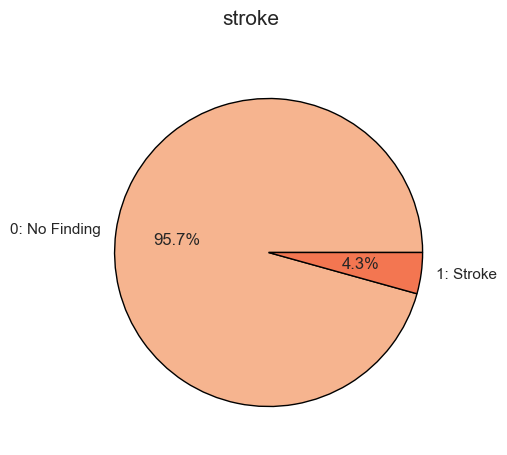

In [15]:
# A pie chart for the percentage of people who have STROKE and who don't have.
colors = sns.color_palette("rocket_r")


fig, ax = plt.subplots(figsize=(14,5))
# figure title
fig.suptitle('stroke', fontsize=15)


plot_data = training_set['stroke'].value_counts()
plot_labels = plot_data.rename(index={0:'0: No Finding', 1:'1: Stroke'}).index
ax.pie(plot_data, labels=plot_labels, autopct='%1.1f%%', colors=colors, wedgeprops = dict(edgecolor='black'))


plt.show()

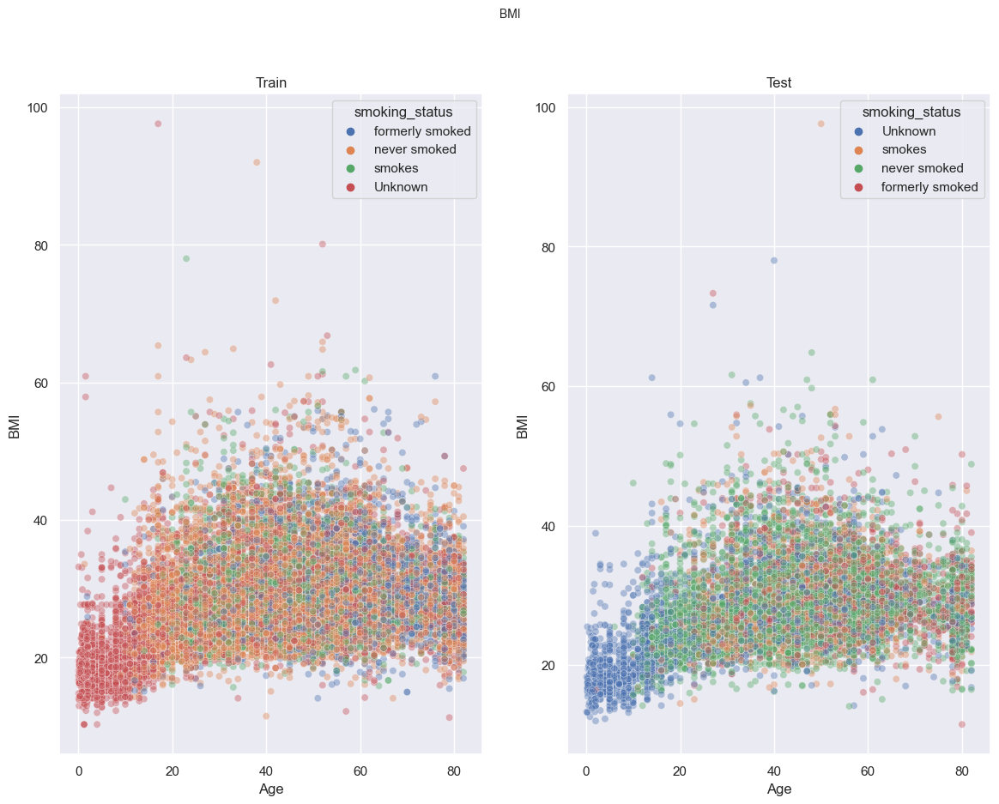

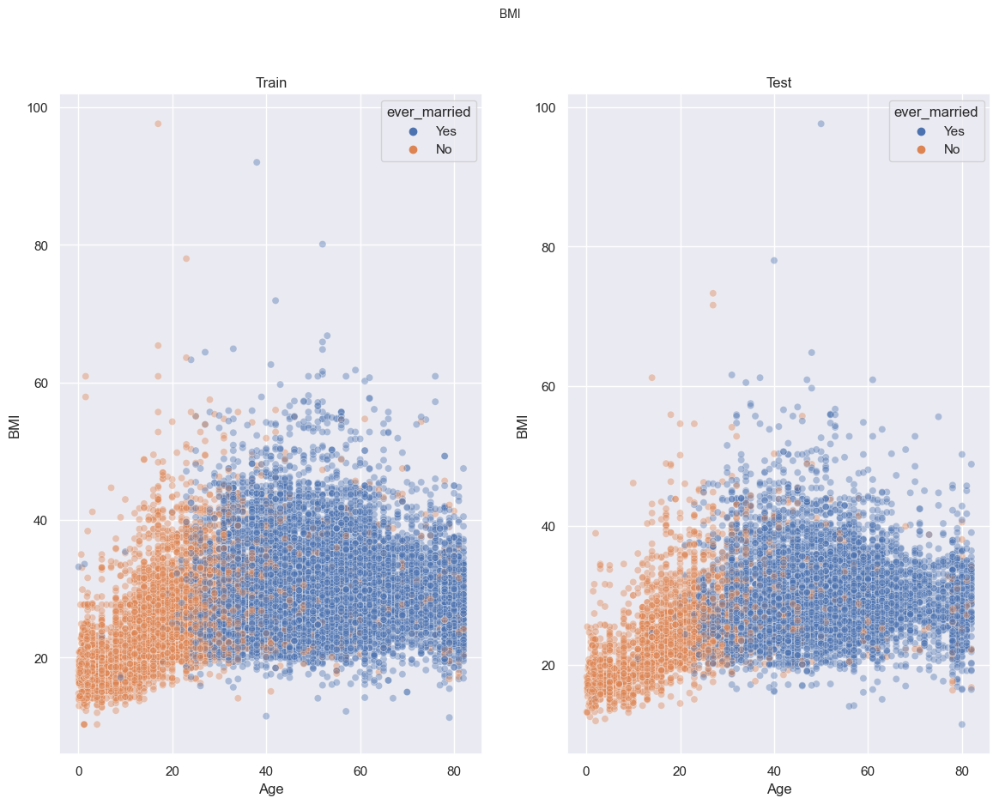

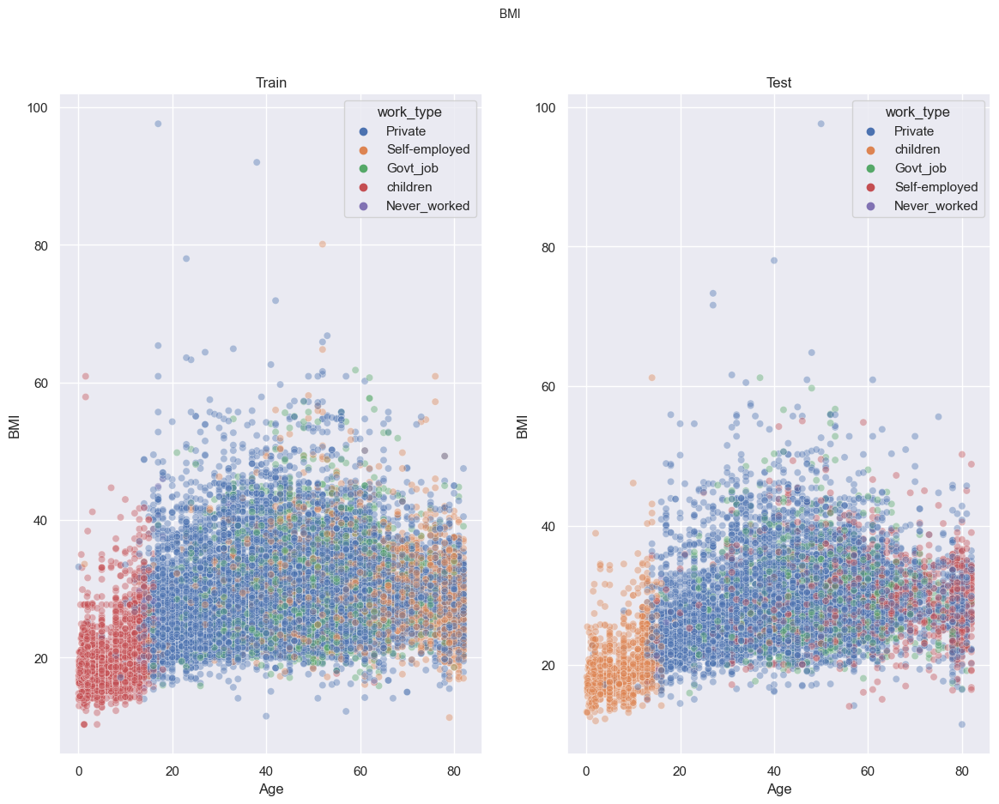

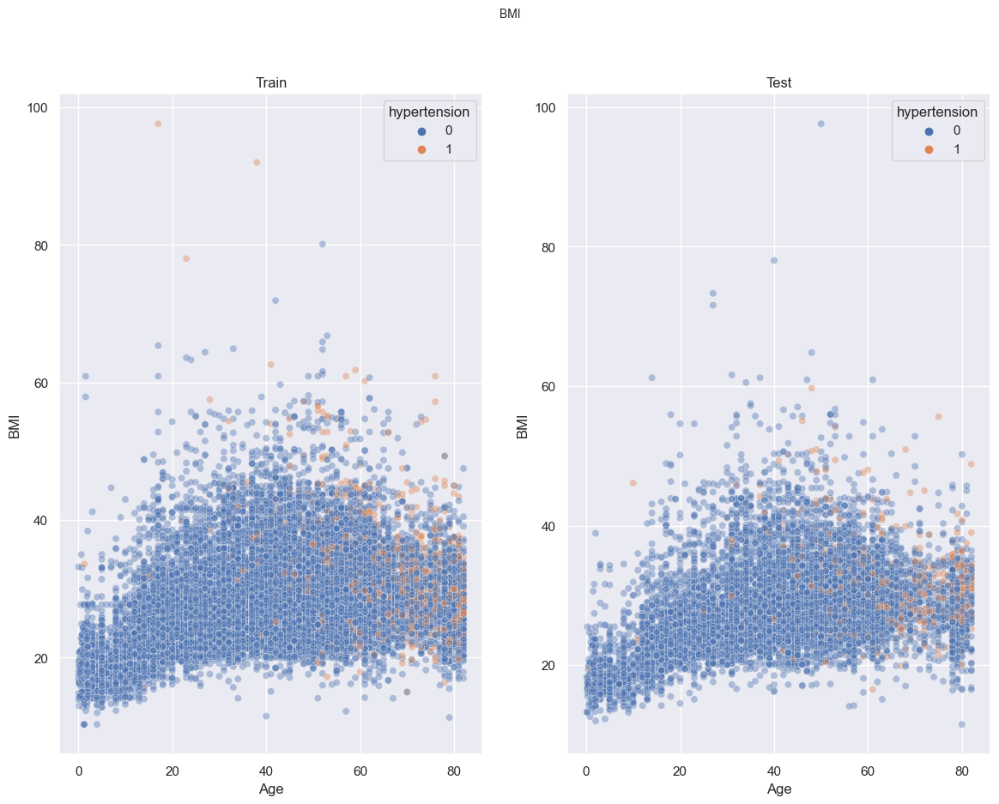

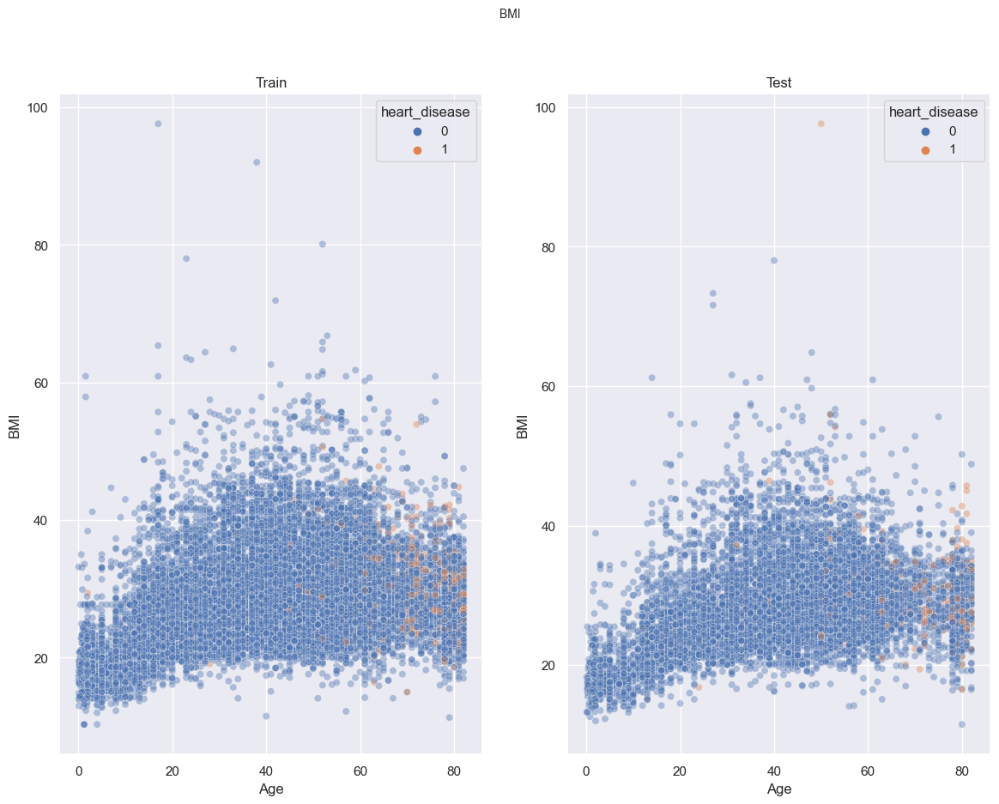

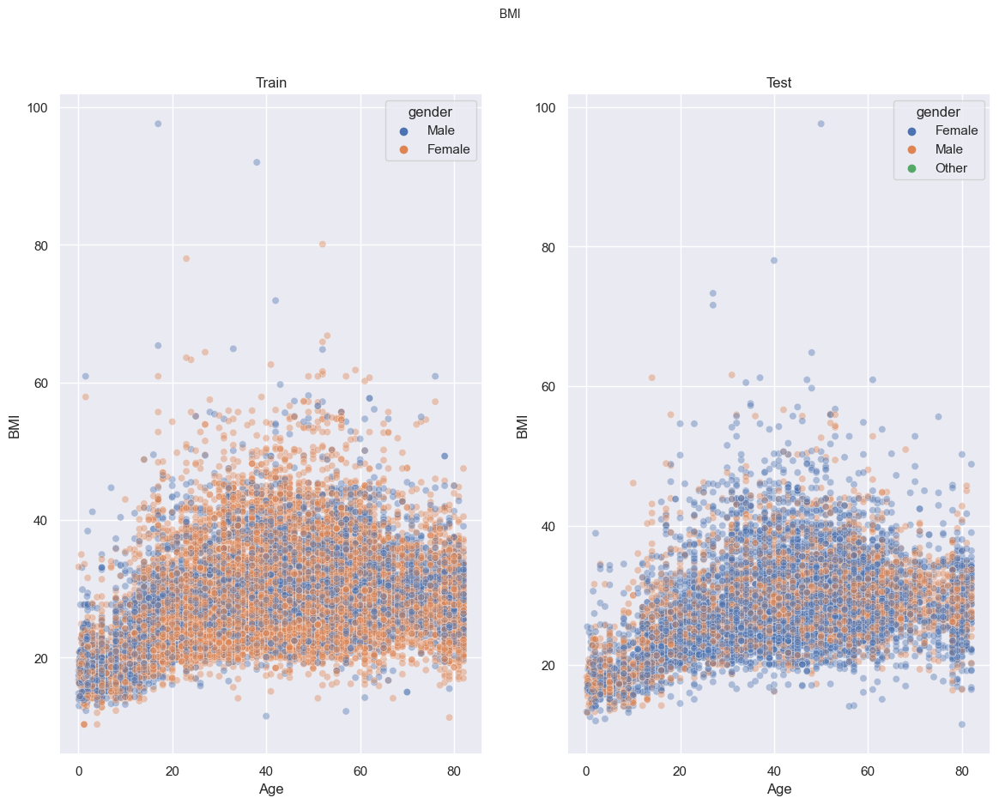

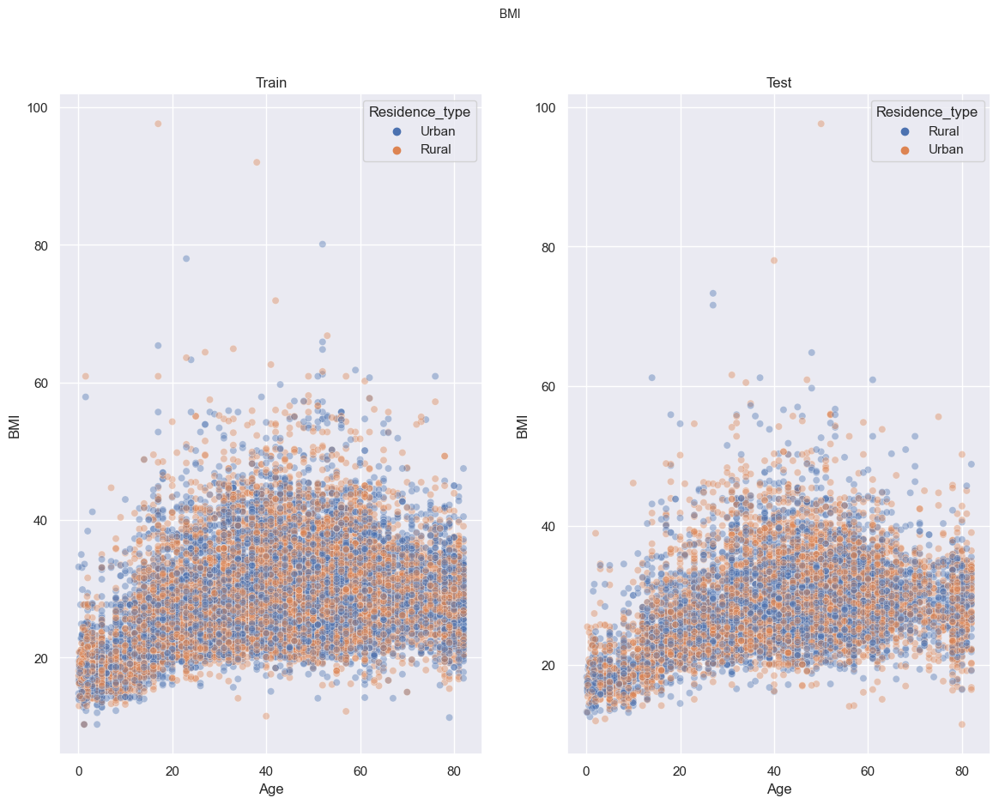

In [16]:
# A scatter plot for the Age and BMI for both the Train and Test sets with HUE for every categorical feature
hue_col = ["smoking_status", "ever_married", "work_type", "hypertension", "heart_disease", "gender", "Residence_type"]
for i in hue_col:
    fig, ax = plt.subplots(1, 2, figsize =(14,10))
    fig.suptitle("BMI", fontsize=10)
        
    plt_train_data = sns.scatterplot(y=training_set['bmi'], x=training_set['age'], hue=training_set[i], alpha=0.4, ax=ax[0])
    ax[0].set_xlabel('Age')
    ax[0].set_ylabel("BMI")
    ax[0].set_title("Train")
        
    plt_test_data = sns.scatterplot(y=test_set['bmi'], x=test_set['age'], hue=test_set[i], alpha=0.4, ax=ax[1])
    ax[1].set_xlabel('Age')
    ax[1].set_ylabel("BMI")
    ax[1].set_title("Test")
    plt.show()

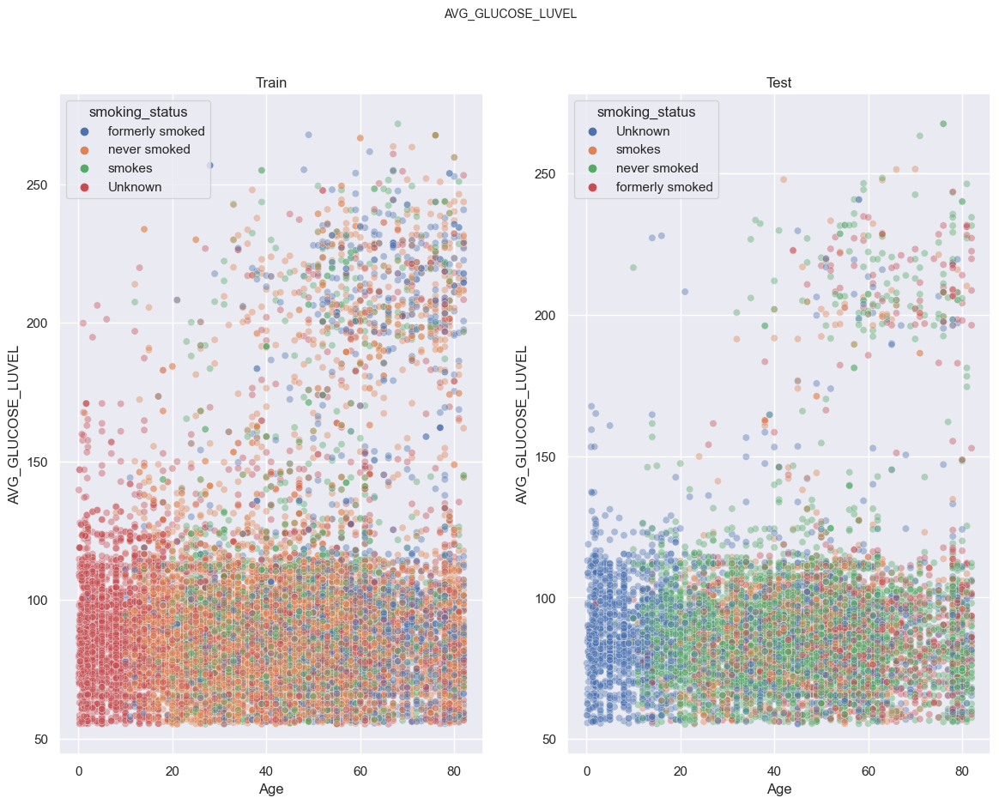

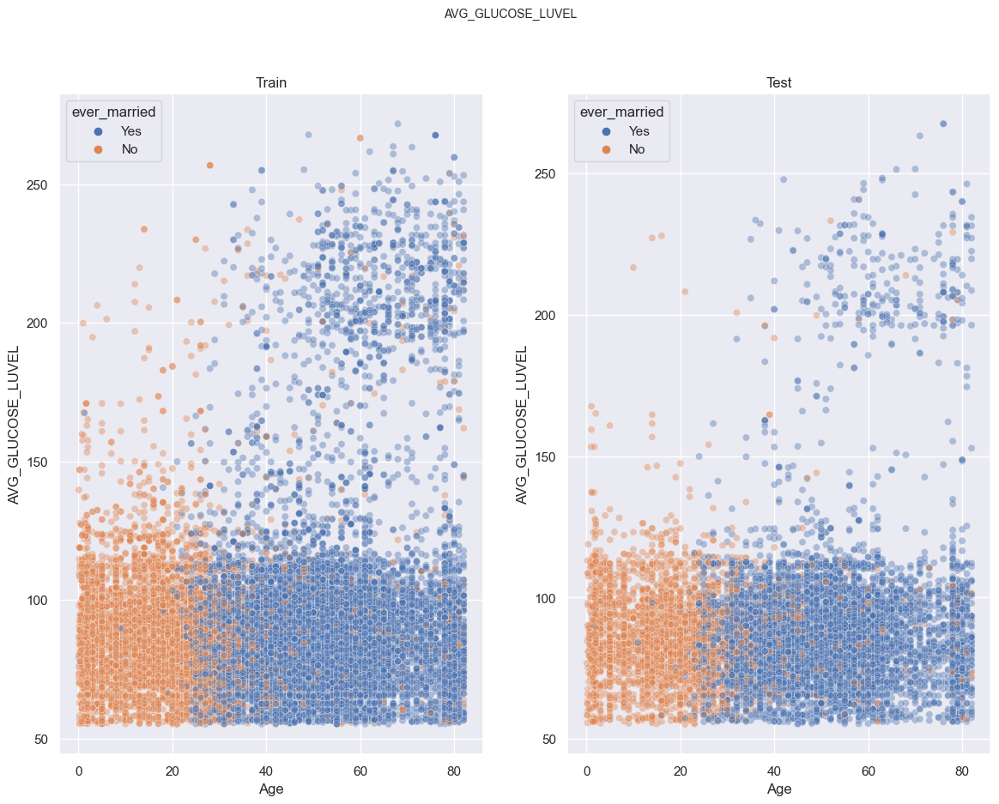

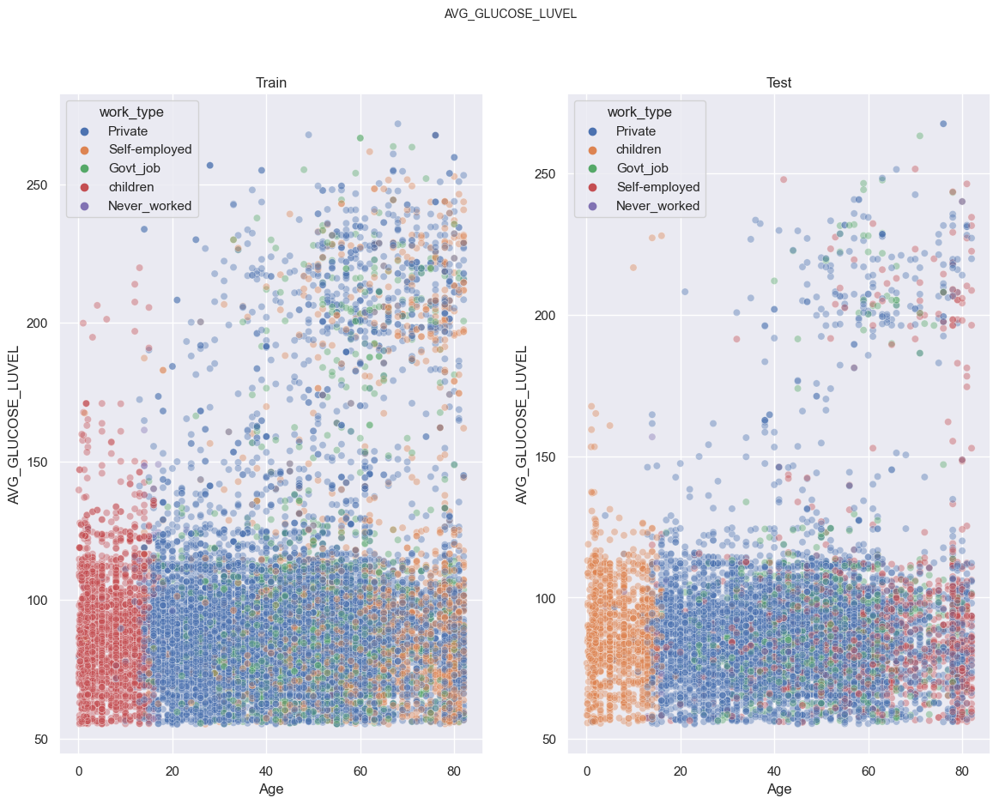

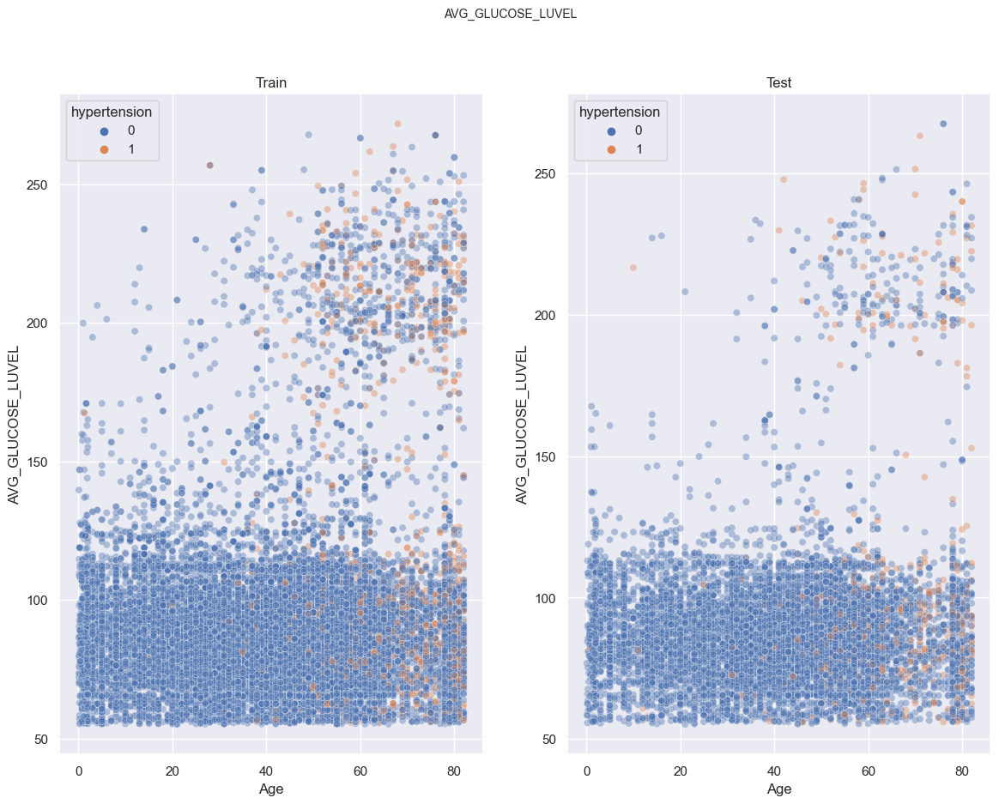

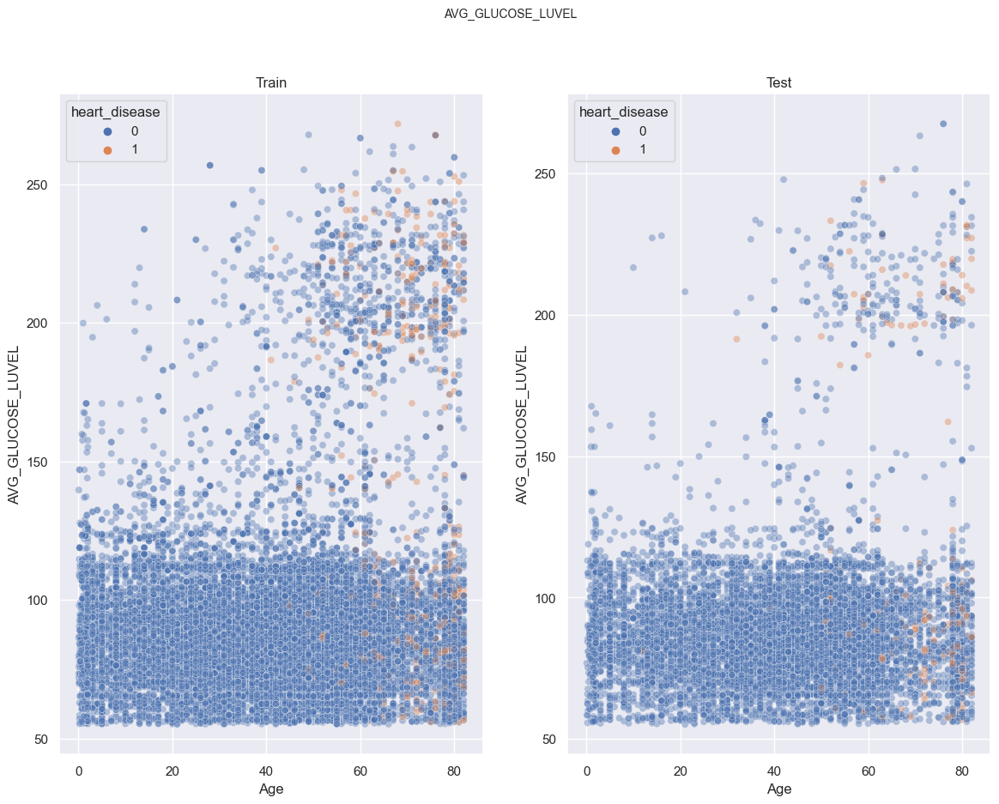

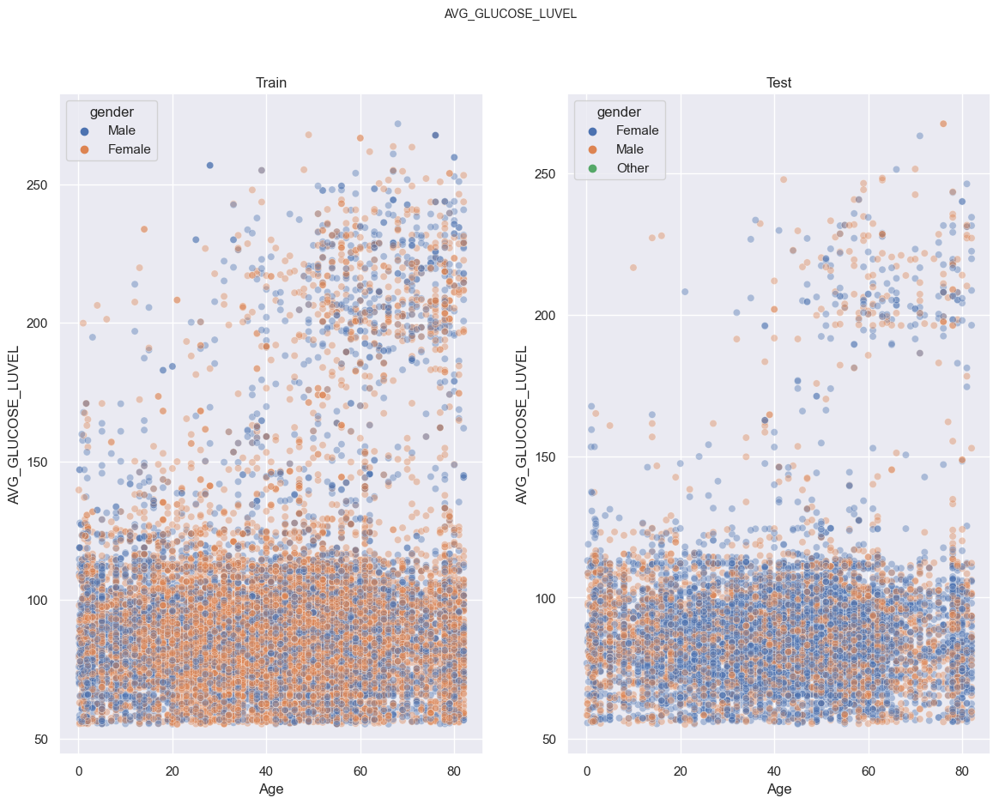

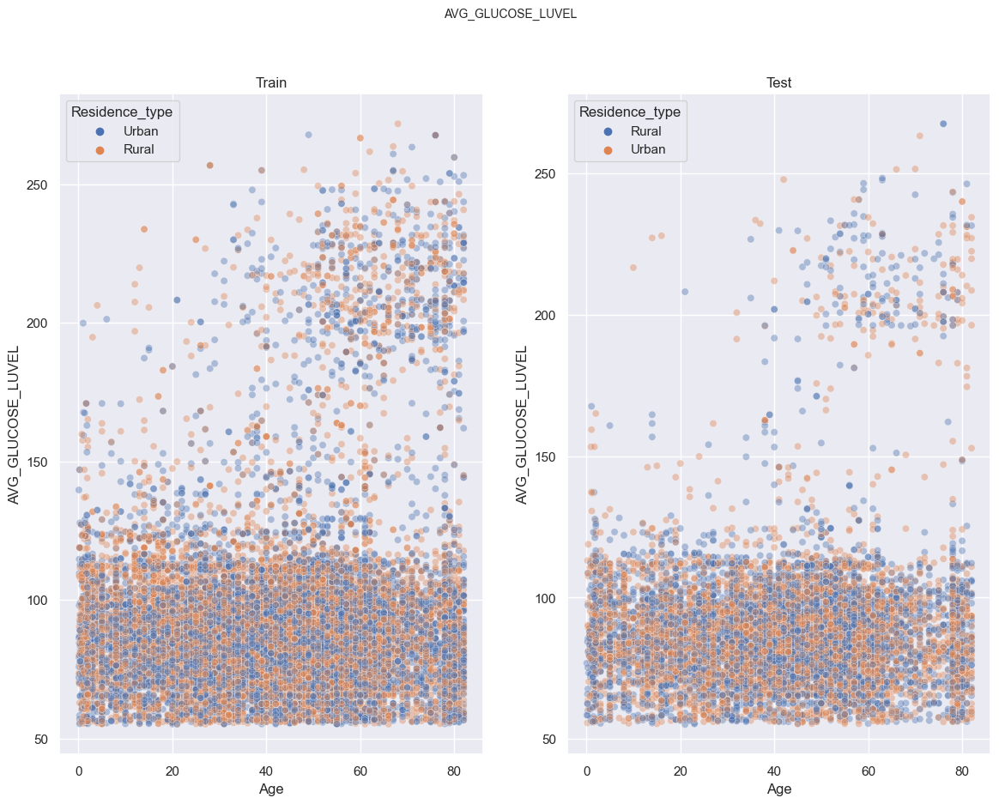

In [17]:
# A scatter plot for the Age and AVG_GLUCOSE_LEVEL for both the Train and Test sets with HUE for every categorical feature
hue_col = ["smoking_status", "ever_married", "work_type", "hypertension", "heart_disease", "gender", "Residence_type"]
for i in hue_col:
    fig, ax = plt.subplots(1, 2, figsize =(14,10))
    fig.suptitle("AVG_GLUCOSE_LUVEL", fontsize=10)
        
    plt_train_data = sns.scatterplot(y=training_set['avg_glucose_level'], x=training_set['age'], hue=training_set[i], alpha=0.4, ax=ax[0])
    ax[0].set_xlabel('Age')
    ax[0].set_ylabel("AVG_GLUCOSE_LUVEL")
    ax[0].set_title("Train")
        
    plt_test_data = sns.scatterplot(y=test_set['avg_glucose_level'], x=test_set['age'], hue=test_set[i], alpha=0.4, ax=ax[1])
    ax[1].set_xlabel('Age')
    ax[1].set_ylabel("AVG_GLUCOSE_LUVEL")
    ax[1].set_title("Test")
    plt.show()

In [18]:


# # Define the list of columns
# columns = ['gender', 'hypertension', 'heart_disease', 'ever_married', 'work_type', 'Residence_type', 'smoking_status']

# for column in columns:
#     # Get unique values from training and test sets
#     x_train = list(training_set[column].unique())
#     x_test = list(test_set[column].unique())
#     x = list(OrderedDict.fromkeys(x_train + x_test))
#     if all([str(item).isdigit() for item in x]):
#         x.sort()

#     sns.set_style('whitegrid')
#     fig, ax = plt.subplots(1, 2, figsize=(14, 8))

#     fig.suptitle(column, fontsize=15)

#     fig_train = training_set[column].value_counts(normalize=True).reindex(x)
#     fig_test = test_set[column].value_counts(normalize=True).reindex(x)

#     fig_train.plot(kind='bar', align='edge', width=-0.5, ax=ax[0], color=colors[4], edgecolor='black')
#     fig_test.plot(kind='bar', align='center', width=0.5, ax=ax[0], color=colors[3], edgecolor='black')

#     ax[0].set_ylabel('Percent', fontsize=10)
#     ax[0].legend(['Train', 'Test'])

#     sns.pointplot(data=training_set, x=column, y='stroke', color=colors[4], ax=ax[1])
#     ax[1].tick_params(axis='x', labelsize=8, rotation=90)
#     ax[1].set_xlabel('')
#     ax[1].set_ylabel('Stroke Likelihood', fontsize=12)

#     plt.show()


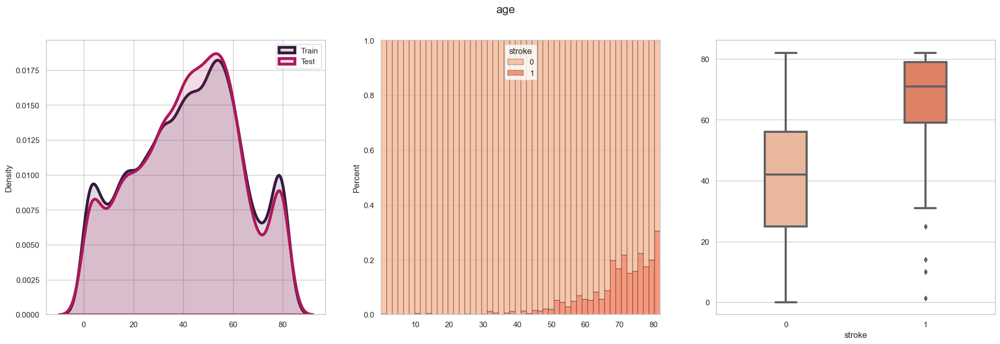

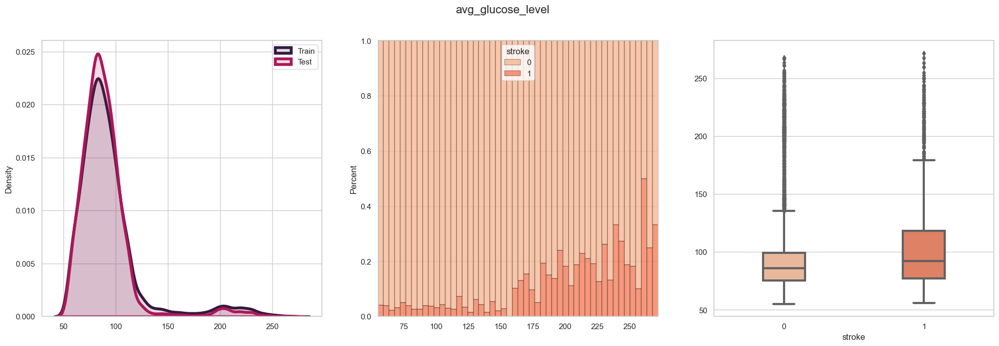

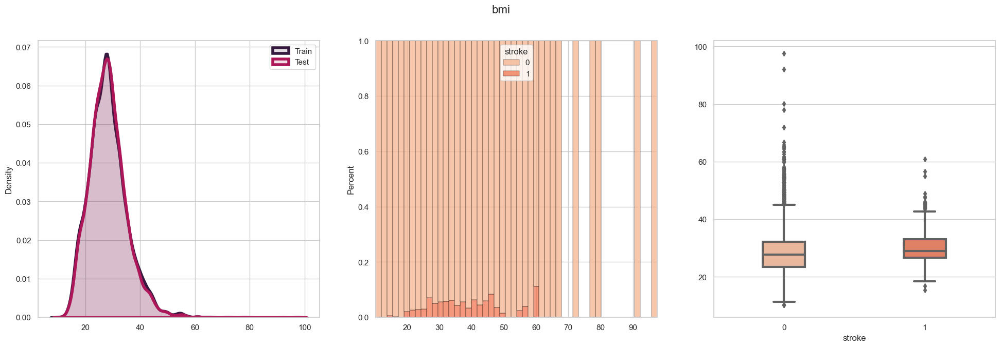

In [19]:
# A KDE, Histogram, and Box plots for every numerical feature
column = ['age', 'avg_glucose_level', 'bmi']
colors = sns.color_palette("rocket_r")

for i in column:
    sns.set_style('whitegrid')
    fig, ax = plt.subplots(1, 3, figsize=(24,7))

    fig.suptitle(i, fontsize=16)

 
    sns.kdeplot(training_set[i], fill=True, color=colors[5], ax=ax[0], label='Train', alpha=0.15, linewidth=4)
    sns.kdeplot(test_set[i], fill=True, color=colors[3], ax=ax[0], label='Test', alpha=0.15, linewidth=4)
    ax[0].set_xlabel('')
    ax[0].set_ylabel('Density')
    handles, labels = ax[0].get_legend_handles_labels()
    ax[0].legend(handles, labels)
    

    sns.histplot(x=i, data=training_set, hue='stroke', bins=50, stat='percent', ax=ax[1], multiple='fill', palette=colors[:2], linewidth=0.3, edgecolor='black') 
    ax[1].set_xlabel('')
    legend = ax[1].get_legend()
    handles = legend.legend_handles
    ax[1].legend(handles, ['0', '1'], title='stroke')

    sns.boxplot(y=i, x='stroke', data=training_set, width=0.3, ax=ax[2], palette=colors, linewidth=3)
    ax[2].set_xlabel('stroke')
    ax[2].set_ylabel('')

    plt.show()

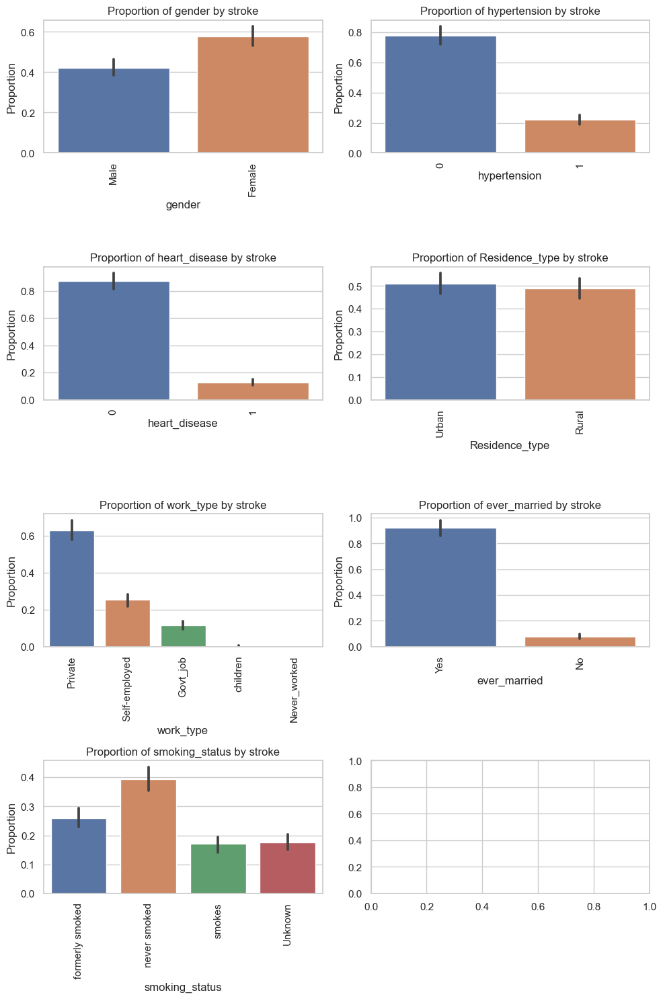

In [20]:
# A proporton bar plots for every feature
plot_columns = ['gender','hypertension','heart_disease','Residence_type','work_type','ever_married','smoking_status']
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(10, 15))
axes = axes.flatten()

for i, columns in enumerate(plot_columns):
    sns.barplot(x=columns, y='stroke', data=training_set, estimator=lambda x: sum(x) /training_set['stroke'].sum(), ax=axes[i])

    axes[i].set_title(f"Proportion of {columns} by stroke")
    axes[i].set_xlabel(columns)
    axes[i].set_ylabel("Proportion")
    axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)

plt.tight_layout(pad=1)
plt.show()

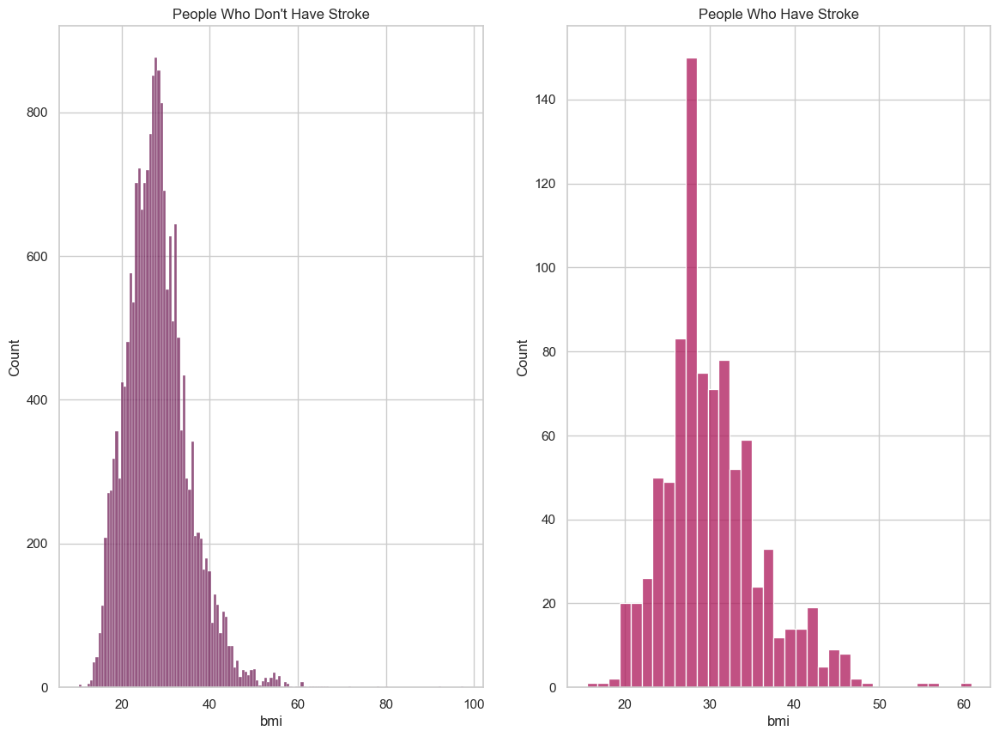

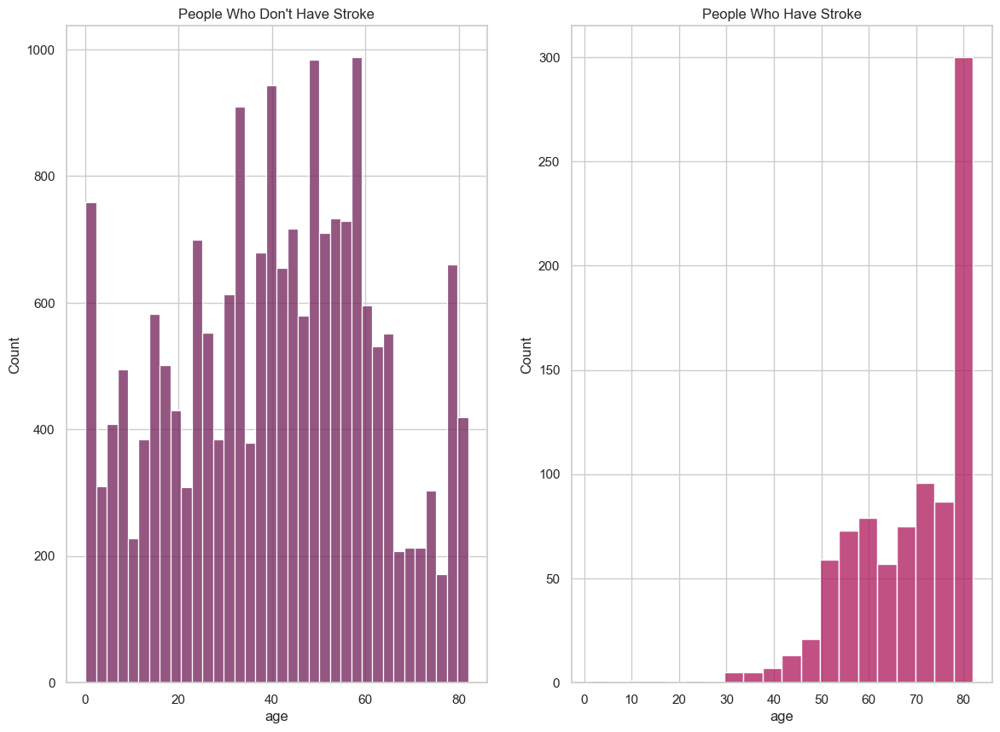

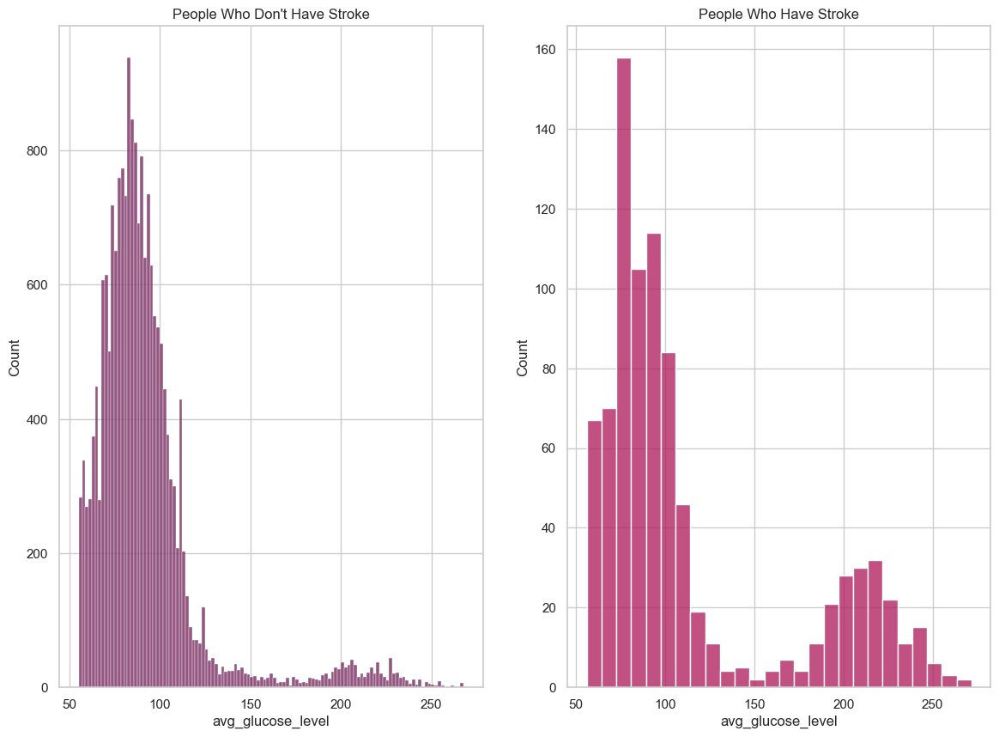

In [21]:
# A histogram plot for people who have stroke and who don't have
colours = sns.color_palette("rocket_r")
column = ['bmi', 'age', 'avg_glucose_level']
for i in column:

    fig,ax = plt.subplots(1,2,figsize=(14,10))
    sns.histplot(data=training_set[training_set['stroke'] == 0],x=i, ax = ax[0], color = colours[4])
    ax[0].set_title("People Who Don't Have Stroke")
    
    sns.histplot(data=training_set[training_set['stroke'] == 1],x=i, ax = ax[1], color= colours[3])
    ax[1].set_title("People Who Have Stroke")
    plt.show()

In [22]:
training_set.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20411 entries, 0 to 15303
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   gender             20411 non-null  object 
 1   age                20411 non-null  float64
 2   hypertension       20411 non-null  int64  
 3   heart_disease      20411 non-null  int64  
 4   ever_married       20411 non-null  object 
 5   work_type          20411 non-null  object 
 6   Residence_type     20411 non-null  object 
 7   avg_glucose_level  20411 non-null  float64
 8   bmi                20411 non-null  float64
 9   smoking_status     20411 non-null  object 
 10  stroke             20411 non-null  int64  
dtypes: float64(3), int64(3), object(5)
memory usage: 1.9+ MB


In [23]:
training_set.head()

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,27.7,never smoked,1
2,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1


## Feature Engineering 

In [24]:

# training_set['risk_factors'] = training_set[[
#       'avg_glucose_level', 'age', 'bmi', 
#       'hypertension', 'heart_disease', 
#       'smoking_status'
#   ]].apply(
#       lambda x: \
#       0 + (1 if x.avg_glucose_level > 99 else 0) + \
#       (1 if x.age > 45 else 0) + (1 if x.bmi > 24.99 else 0) + \
#       (1 if x.hypertension == 1 else 0) + \
#       (1 if x.heart_disease == 1 else 0) + \
#       (1 if x.smoking_status in ['formerly smoked', 'smokes'] else 0),
#       axis=1
#   )
# training_set.head()



# test_set['risk_factors'] = test_set[[
#       'avg_glucose_level', 'age', 'bmi', 
#       'hypertension', 'heart_disease', 
#       'smoking_status'
#   ]].apply(
#       lambda x: \
#       0 + (1 if x.avg_glucose_level > 99 else 0) + \
#       (1 if x.age > 45 else 0) + (1 if x.bmi > 24.99 else 0) + \
#       (1 if x.hypertension == 1 else 0) + \
#       (1 if x.heart_disease == 1 else 0) + \
#       (1 if x.smoking_status in ['formerly smoked', 'smokes'] else 0),
#       axis=1
#   )
# test_set.head()


## Encoding & Scaling

In [25]:
# categorical = ['gender', 'ever_married', 'work_type', 'Residence_type', 'smoking_status','hypertension', 'heart_disease']
# numerical = ['age', 'avg_glucose_level', 'bmi']
# target = ['stroke']
# training_set[categorical] = training_set[categorical].astype('category') 
# all = categorical + numerical
# X_tr , X_val, y_tr, y_val = train_test_split(training_set[all], training_set[target], test_size=0.33)
# encoder = OneHotEncoder(drop_last=True, variables= categorical)
# scaler = SklearnTransformerWrapper(StandardScaler(), variables= numerical)

In [26]:
training_set

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,27.7,never smoked,1
2,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1
...,...,...,...,...,...,...,...,...,...,...,...
15299,Female,22.0,0,0,No,Govt_job,Urban,72.63,19.5,never smoked,0
15300,Female,46.0,1,0,Yes,Private,Urban,101.19,32.1,never smoked,0
15301,Female,75.0,0,0,Yes,Self-employed,Urban,87.69,26.2,never smoked,0
15302,Male,46.0,0,0,Yes,Private,Rural,101.13,22.5,Unknown,0


### Preprocessing The Train data

In [27]:
train_set = training_set.copy()
train_set['gender'] = train_set['gender'].map({'Female':0,'Male':1})
train_set['ever_married'] = train_set['ever_married'].map({'No':0,'Yes':1})
train_set['work_type'] = train_set['work_type'].map({'Private':2,'Self-employed':4,'Govt_job':3,'children':1,'Never_worked':0})
train_set['smoking_status']= train_set['smoking_status'].map({'formerly smoked':3 ,'never smoked':1 , 'smokes':2 , 'Unknown':0})
train_set['Residence_type'] = train_set["Residence_type"].map({'Urban':1 , 'Rural':0})

train_set.dtypes



gender                 int64
age                  float64
hypertension           int64
heart_disease          int64
ever_married           int64
work_type              int64
Residence_type         int64
avg_glucose_level    float64
bmi                  float64
smoking_status         int64
stroke                 int64
dtype: object

<Axes: title={'center': 'correlation of the data with having a stroke'}>

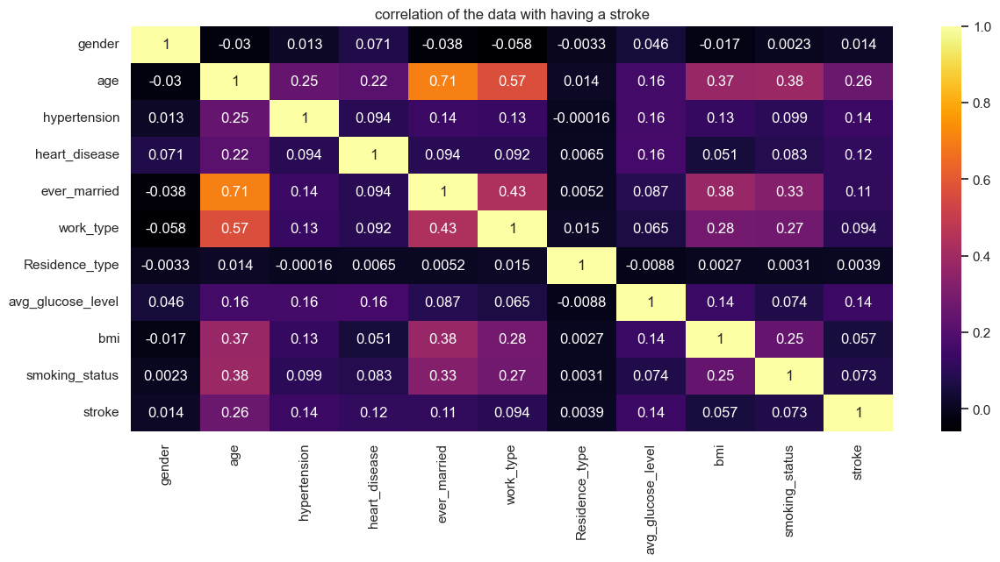

In [28]:
plt.figure(figsize = (14,6))

plt.title("correlation of the data with having a stroke")

corr_heatmap= train_set.corr()
sns.heatmap(corr_heatmap , annot =True,cmap ='inferno')

#so from the heatmap it seems like the age is the biggest indicator here.
#then we have heart disease hypertension and glocuse level.  

In [29]:
train_set.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20411 entries, 0 to 15303
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   gender             20411 non-null  int64  
 1   age                20411 non-null  float64
 2   hypertension       20411 non-null  int64  
 3   heart_disease      20411 non-null  int64  
 4   ever_married       20411 non-null  int64  
 5   work_type          20411 non-null  int64  
 6   Residence_type     20411 non-null  int64  
 7   avg_glucose_level  20411 non-null  float64
 8   bmi                20411 non-null  float64
 9   smoking_status     20411 non-null  int64  
 10  stroke             20411 non-null  int64  
dtypes: float64(3), int64(8)
memory usage: 1.9 MB


## Preprocessing the test data

In [30]:
test_data = test_set.copy()
test_data['gender'] =test_data['gender'].map({'Female':0,'Male':1,'Other':2})
test_data['work_type'] = test_data['work_type'].map({'Private':2,'Self-employed':4,'Govt_job':3,'children':1,'Never_worked':0})
test_data['ever_married'] = test_data['ever_married'].map({'No':0,'Yes':1})
test_data['smoking_status']= test_data['smoking_status'].map({'formerly smoked':3 ,'never smoked':1 , 'smokes':2 , 'Unknown':0})
test_data['Residence_type'] = test_data["Residence_type"].map({'Urban':1 , 'Rural':0})


In [31]:
test_data

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status
0,15304,0,57.0,0,0,1,2,0,82.54,33.4,0
1,15305,1,70.0,1,0,1,2,1,72.06,28.5,0
2,15306,0,5.0,0,0,0,1,1,103.72,19.5,0
3,15307,0,56.0,0,0,1,3,1,69.24,41.4,2
4,15308,1,32.0,0,0,1,2,0,111.15,30.1,2
...,...,...,...,...,...,...,...,...,...,...,...
10199,25503,0,27.0,0,0,0,2,1,75.77,17.6,1
10200,25504,1,49.0,0,0,1,2,1,102.91,26.7,0
10201,25505,0,3.0,0,0,0,1,0,104.04,18.3,0
10202,25506,1,31.0,0,0,1,2,1,82.41,28.7,1


In [32]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10204 entries, 0 to 10203
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 10204 non-null  int64  
 1   gender             10204 non-null  int64  
 2   age                10204 non-null  float64
 3   hypertension       10204 non-null  int64  
 4   heart_disease      10204 non-null  int64  
 5   ever_married       10204 non-null  int64  
 6   work_type          10204 non-null  int64  
 7   Residence_type     10204 non-null  int64  
 8   avg_glucose_level  10204 non-null  float64
 9   bmi                10204 non-null  float64
 10  smoking_status     10204 non-null  int64  
dtypes: float64(3), int64(8)
memory usage: 877.0 KB


In [33]:
y = train_set['stroke']
features =['gender', 'age','hypertension','ever_married','work_type','heart_disease', 'avg_glucose_level', 'bmi','smoking_status','Residence_type']
X = train_set[features]

## Modeling using XGB & other models

### Logistic Regression

In [34]:
categorical = ['gender', 'ever_married', 'work_type', 'Residence_type', 'smoking_status','hypertension', 'heart_disease']
numerical = ['age', 'avg_glucose_level', 'bmi']
target = ['stroke']
training_set[categorical] = training_set[categorical].astype('category') 
all = categorical + numerical
X_train , X_valid, y_train, y_valid = train_test_split(training_set[all], training_set[target], test_size=0.33)
encoder = OneHotEncoder(drop_last=True, variables= categorical)
scaler = SklearnTransformerWrapper(StandardScaler(), variables= numerical)

LR = LogisticRegression()

X_train = encoder.fit_transform(X_train)
X_train = scaler.fit_transform(X_train)

X_valid = encoder.transform(X_valid)
X_valid = scaler.transform(X_valid)

LR.fit(X_train, y_train)

val_preds = LR.predict_proba(X_valid)[:, 1]
print(mean_absolute_error(y_valid, val_preds))

X_test = test_set[all].copy()



0.07185261140477274


c:\Users\yaman\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [35]:
print("Training set Score: ",LR.score(X_train,y_train))
print("Testing set Score: ",LR.score(X_valid,y_valid))


Training set Score:  0.9564168190127971
Testing set Score:  0.9576900237529691


In [36]:
X_test = test_set[all].copy()

X_test = encoder.transform(X_test)
X_test = scaler.transform(X_test)

preds = LR.predict_proba(X_test)[:, 1]
output = pd.DataFrame({'id': test_set['id'], 'stroke' : preds})
output.to_csv('../resources/LR_Preds.csv', index= False)

### Random Forest Classifier

In [37]:
X_tr, X_val, y_tr, y_val = train_test_split(X, y, test_size=0.33)
X_test = test_data[features]

In [38]:
from sklearn.ensemble import RandomForestClassifier

 # create and train the Random Forest classifier
params = {
     'n_estimators': 100,
     'max_depth': 3,
     'min_samples_split': 3,
     'min_samples_leaf': 3,
     'bootstrap': True,
     'random_state': 42
}
RFC = RandomForestClassifier(**params)
RFC.fit(X_tr,y_tr)
val_preds = RFC.predict_proba(X_val)[:,1]



In [39]:
print("Training set Score: ",RFC.score(X_tr,y_tr))
print("Testing set Score: ",RFC.score(X_val,y_val))
print(mean_absolute_error(y_val, val_preds))

Training set Score:  0.9556855575868373
Testing set Score:  0.9591745843230404
0.07479967325009661


In [40]:

RFC_preds = RFC.predict_proba(X_test)[:,1]
output = pd.DataFrame({'id': test_data['id'], 'stroke': RFC_preds})
output.to_csv("../resources/RFC.csv", index=False)

### LGBM Classifier

In [41]:
from lightgbm import LGBMClassifier

# # create and train the LightGBM classifier
params = {
     'max_depth': 3,
     'learning_rate': 0.1,
     'subsample': 0.8,
     'colsample_bytree': 0.8,
     'reg_alpha': 0.5,
     'reg_lambda': 1.5,
     'min_child_weight': 5,
    'objective': 'binary',
     'metric': 'auc'
}
LGBM = LGBMClassifier(**params)
LGBM.fit(X_tr, y_tr)


LGBM_preds = LGBM.predict_proba(X_val)[:, 1]


In [42]:
print("Training set Score: ",LGBM.score(X_tr,y_tr))
print("Testing set Score: ",LGBM.score(X_val,y_val))
print(mean_absolute_error(y_val, LGBM_preds))

Training set Score:  0.9564168190127971
Testing set Score:  0.9591745843230404
0.07054537645298518


In [43]:
LGBM_preds = LGBM.predict_proba(X_test)[:,1]
output = pd.DataFrame({'id': test_data['id'], 'stroke': LGBM_preds})
output.to_csv("../resources/LGBM.csv", index=False)

### CatBoost Classifier

In [44]:
from catboost import CatBoostClassifier

# create and train the CatBoost classifier
params = {
     'iterations': 150,
     'learning_rate': 0.1,
     'depth': 4,
     'l2_leaf_reg': 2,
     'border_count': 64,
     'thread_count': -1,
     'loss_function': 'Logloss',
     'eval_metric': 'AUC',
     'random_seed': 42
}

cbf = CatBoostClassifier(**params)
cbf.fit(X_tr, y_tr)


# make predictions on the test set
predss = cbf.predict_proba(X_val)[:, 1]



0:	total: 150ms	remaining: 22.3s
1:	total: 151ms	remaining: 11.2s
2:	total: 153ms	remaining: 7.5s
3:	total: 155ms	remaining: 5.64s
4:	total: 156ms	remaining: 4.54s
5:	total: 158ms	remaining: 3.8s
6:	total: 160ms	remaining: 3.26s
7:	total: 161ms	remaining: 2.86s
8:	total: 163ms	remaining: 2.55s
9:	total: 164ms	remaining: 2.3s
10:	total: 166ms	remaining: 2.09s
11:	total: 167ms	remaining: 1.92s
12:	total: 168ms	remaining: 1.77s
13:	total: 170ms	remaining: 1.65s
14:	total: 171ms	remaining: 1.54s
15:	total: 172ms	remaining: 1.44s
16:	total: 174ms	remaining: 1.36s
17:	total: 175ms	remaining: 1.28s
18:	total: 177ms	remaining: 1.22s
19:	total: 178ms	remaining: 1.16s
20:	total: 180ms	remaining: 1.1s
21:	total: 181ms	remaining: 1.05s
22:	total: 182ms	remaining: 1.01s
23:	total: 184ms	remaining: 967ms
24:	total: 186ms	remaining: 929ms
25:	total: 187ms	remaining: 894ms
26:	total: 189ms	remaining: 860ms
27:	total: 190ms	remaining: 830ms
28:	total: 192ms	remaining: 800ms
29:	total: 193ms	remaining: 

In [45]:
print("Training set Score: ",cbf.score(X_tr,y_tr))
print("Testing set Score: ",cbf.score(X_val,y_val))
print(mean_absolute_error(y_val, predss))

Training set Score:  0.9585374771480805
Testing set Score:  0.9584323040380047
0.07038181177416256


In [46]:

cbf_preds = cbf.predict_proba(X_test)[:,1]
output = pd.DataFrame({'id': test_data['id'], 'stroke': cbf_preds})
output.to_csv("../resources/cbf.csv", index=False)

## Defining The parameters for the model

In [47]:
from xgboost import XGBClassifier
# create and train the XGBoost classifier
params = {
    'max_depth': 3,
    'eta': 0.15,
    'subsample': 0.8,
    'colsample_bytree': 0.8,
    'gamma': 0.4,
    'lambda': 1.5,
    'alpha': 0.4,
    'min_child_weight': 5,
    'max_delta_step': 1,
    'objective': 'binary:logistic',
    'eval_metric': 'auc'
}
model = XGBClassifier(**params)

## Hold-out Validation

In [48]:
model.fit(X_tr,y_tr)
val_preds = model.predict_proba(X_val)[:,1]

In [49]:
print("Training set Score: ",model.score(X_tr,y_tr))
print("Testing set Score: ",model.score(X_val,y_val))
print(mean_absolute_error(y_val, val_preds))

Training set Score:  0.9575868372943327
Testing set Score:  0.9585807600950119
0.07013518345671388


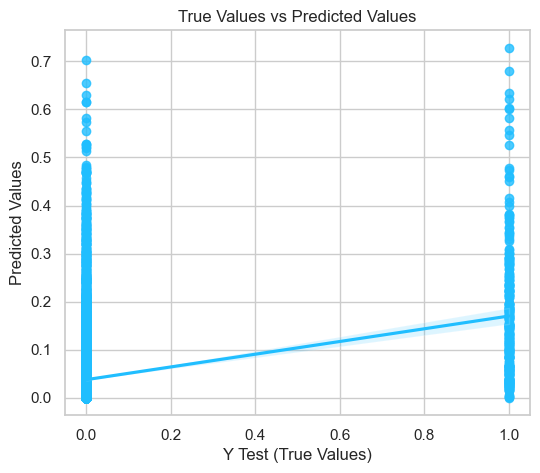

In [50]:
plt.figure(figsize=(6, 5))
sns.regplot(x=y_val, y=val_preds, color='#20BEFF')
plt.xlabel('Y Test (True Values)')
plt.ylabel('Predicted Values')
plt.title('True Values vs Predicted Values')
plt.show()

## Confusion Matrix 

In [51]:
model.fit(X_tr, y_tr)
val_preds = model.predict(X_val)

confusion_mat = confusion_matrix(y_val, val_preds)
print(confusion_mat)

accuracy = accuracy_score(y_val, val_preds)
print("Accuracy:", accuracy)

[[6447   14]
 [ 265   10]]
Accuracy: 0.9585807600950119


In [52]:

preds = model.predict_proba(X_test)[:, 1]

## Fitting the model

<function matplotlib.pyplot.show(close=None, block=None)>

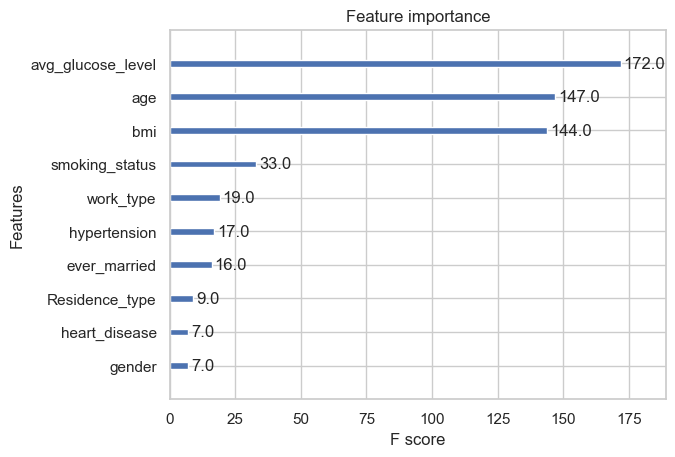

In [53]:
xgb.plot_importance(model)
plt.show

## Generating Predictions 🎉

In [54]:
output = pd.DataFrame({'id': test_data['id'], 'stroke': preds})


In [55]:
output.to_csv('../resources/bruhhh.csv',index=False)


In [56]:
import pickle
def encode_file(obj, file_path):
    with open(file_path, 'wb') as file:
        pickle.dump(obj, file)
encode_file(model,'../model/model.pkl')
encode_file(RFC, '../model/RFC.pkl')
encode_file(LGBM, '../model/LGBM.pkl')
encode_file(cbf, '../model/cbf.pkl')
